In [240]:
from torch.utils.data import DataLoader

In [241]:
import os
import wandb
import numpy as np
from IPython.display import clear_output
import seaborn as sns
from torchdiffeq import odeint
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
import matplotlib.pyplot as plt

In [242]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
print("GPU Name:", torch.cuda.get_device_name(0))


Using device: cuda
GPU Name: NVIDIA GeForce RTX 3070 Ti Laptop GPU


In [243]:
np.random.seed(7)
torch.manual_seed(7)

In [244]:
wandb.login()

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


True

In [245]:
wandb.init(project="lorenz_NODE", group="Lorenz",save_code=True,notes="Neural ODE runs and evaluation")

In [246]:
def visualize(real=None, train=None, save=None, title=''):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    
    ax.set_title('Lorenz Attractor \n'+title)

    if train is not None:
      sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in train])
      z = np.reshape(z, [-1,3])
      sc = ax.scatter(z[:,0], z[:,1], z[:,2], c=z[:,2], cmap='Greens', s=1)

    if real is not None:
      sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in real])
      z = np.reshape(z, [-1,3])
      ax.scatter(z[:,0], z[:,1], z[:,2], marker='.', color='k', alpha=0.5, linewidths=0, s=45)

    fig.canvas.draw()
    fig.canvas.flush_events()
    if save is not None:
        plt.savefig(save+'.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
    plt.show()

In [247]:
class Lorenz(nn.Module):
    """
    chaotic lorenz system
    """
    def __init__(self):
        super(Lorenz, self).__init__()
        self.lin = nn.Linear(5, 3, bias=False)
        W = torch.tensor([[-10., 10., 0., 0., 0.],
                          [28., -1., 0., -1., 0.],
                          [0., 0., -8. / 3., 0., 1.]])
        self.lin.weight = nn.Parameter(W)

    def forward(self, t, x):
        y = y = torch.ones([1, 5])
        y[0][0] = x[0][0]
        y[0][1] = x[0][1]
        y[0][2] = x[0][2]
        y[0][3] = x[0][0] * x[0][2]
        y[0][4] = x[0][0] * x[0][1]
        return self.lin(y)

true_y0 = torch.tensor([[0.5, 0.5, 20.]])  # initial condition
t = torch.linspace(0., 50., 5000)  # t is from 0 to 25 for 1000 data points

In [248]:
# generating training data
with torch.no_grad():
    data = odeint(Lorenz(), true_y0, t)

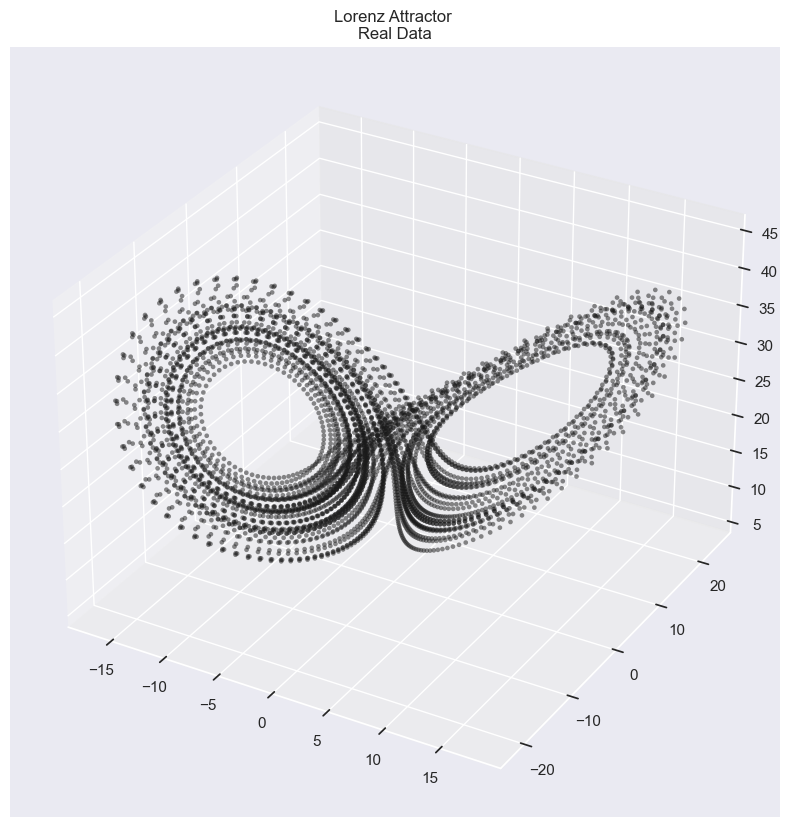

In [249]:
visualize(real=data,save='real',title='Real Data')

In [250]:
data.shape

torch.Size([5000, 1, 3])

In [251]:
t.shape

torch.Size([5000])

In [252]:
wandb_config = {
    'hidden_size': 512,
    'learning_rate': 1e-2,
    'batch_size': 50,
    'max_iterations': 1000,
}

# Initialize wandb configuration
wandb.config.update(wandb_config)

In [253]:
#sweep_id = wandb.sweep(sweep_path="sweep.yaml", project="NODE_rnn")

In [254]:
class LorenzTrain(nn.Module):
    """
    neural network for learning the chaotic lorenz system
    """
    def __init__(self):
        super(LorenzTrain, self).__init__()
        self.lin = nn.Linear(3, 512)
        self.lin3 = nn.Linear(512, 3)
        self.relu = nn.ReLU()

    def forward(self, t, x):
        x = self.relu(self.lin(x))
        x = self.lin3(x)
        return x
     

In [255]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[indices + i] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [256]:
func = LorenzTrain().to(device)  # initializing Neural ODE
visualizer = visualize
optimizer = optim.Adam(func.parameters(), lr=1e-2)

In [257]:
data_tensor = torch.load('data_tensor.pt')

In [258]:
data_tensor.shape

torch.Size([10, 5000, 1, 3])

In [259]:
train = data_tensor[:6].to(device)
val = data_tensor[6].to(device)
test = data_tensor[7:].to(device)

In [260]:
train.shape

torch.Size([6, 5000, 1, 3])

In [261]:
train = train.view(30000,1,3)

In [262]:
t = t.to(device)

In [263]:
val.shape

torch.Size([5000, 1, 3])

In [264]:
#os.makedirs("PNG")

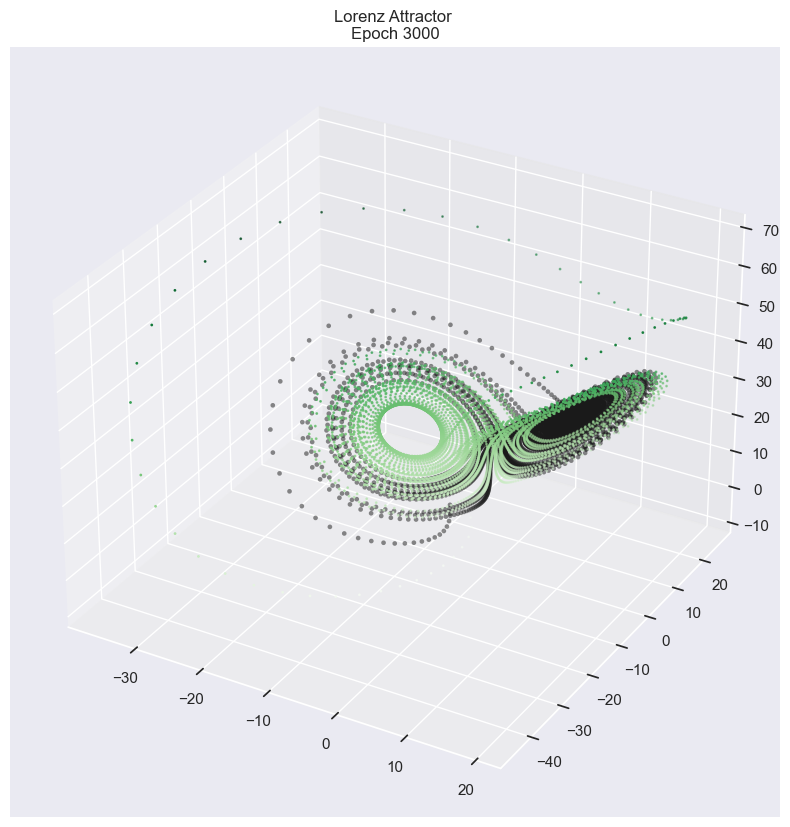

Iter 3000 | Total Loss 143.472519


In [265]:
val_losses = []
epoch_losses = []
best_loss = 1000.0
for itr in range(1, 3000 + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(train,50)  # getting trajectory batch
    pred_y = odeint(func, batch_y0, batch_t)  # prediction using batch initial condition and batch time stamps
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()
    epoch_losses.append(loss.item())
    if loss.item() < best_loss:
                best_loss = loss.item()
                torch.save(func.state_dict(), 'saved_models/lorenz_node.pth')
    if itr % 50 == 0:
        if itr > 1800:
            optimizer.param_groups[0]['lr'] = 1e-3
        with torch.no_grad():
            pred_y = odeint(func, val[0], t)
            loss = F.mse_loss(pred_y, val)
            val_losses.append(loss.item())
            visualize(real=val.cpu(), 
                             train=pred_y.cpu(),save='PNG/NODE/{}'.format(itr),title='Epoch {}'.format(itr))

            print('Iter {:04d} | Val Loss {:.6f}'.format(itr, loss.item()))
            
            clear_output(wait=True)
    print('Iter {:04d} | Train Loss {:.6f}'.format(itr, loss.item()))


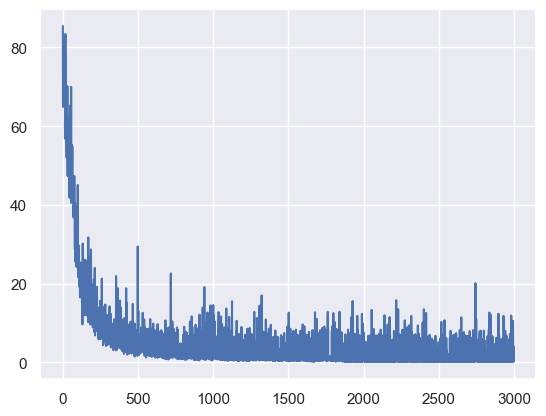

In [266]:
plt.plot(epoch_losses)

In [267]:
training_loss = torch.tensor(epoch_losses)

In [268]:
torch.save(training_loss, 'training_loss_NODE.pt')

In [269]:
validation_loss = torch.tensor(val_losses)

In [270]:
torch.save(validation_loss, 'validation_loss_NODE.pt')

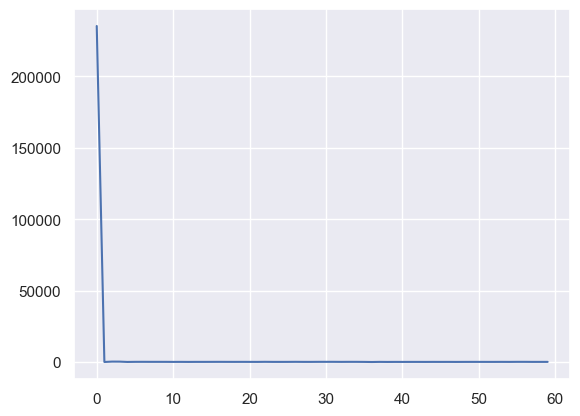

In [271]:
plt.plot(val_losses)

In [272]:
t.shape

torch.Size([5000])

In [273]:
test_model = LorenzTrain().to(device)

In [274]:
test_model.load_state_dict(torch.load('saved_models\lorenz_node.pth'))

<All keys matched successfully>

In [324]:
def evaluate(model,t,test_data,label='',visualizer=visualize):
    preds = []
    losses = []
    for idx in range(len(test_data)):
        num_trajectories = 1  # Number of trajectories to simulate
        trajectories = []
        input_seq = test_data[idx][0]
        with torch.no_grad():
            # Propagate the initial point forward in time
            predicted_trajectory = odeint(model, input_seq.to(device), t)
            test_0_loss = F.mse_loss(predicted_trajectory, test_data[idx].to(device))
            trajectories.append(predicted_trajectory.cpu().numpy())
        losses.append(test_0_loss.item())
        preds.append(predicted_trajectory.cpu())
        torch.save(test_0_loss,f'test_{idx}_loss_NODE.pt')   
        # Convert the tensors to NumPy arrays for plotting
        trajectories_np = np.array(trajectories)
        # Extract the x, y, z coordinates from predictions_plt
        x_pred = trajectories_np[:,:, :, 0]
        y_pred = trajectories_np[:,:, :, 1]
        z_pred = trajectories_np[:,:, :, 2]

        # Extract the x, y, z coordinates from X_train_plt
        x_train = test_data[idx][:, :, 0].cpu()
        y_train = test_data[idx][ :, :, 1].cpu()
        z_train = test_data[idx][ :, :, 2].cpu()

        plt.clf()
        # Create a 3D plot
        fig = plt.figure(figsize=(14,14))
        
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
        ax.scatter(x_train, y_train, z_train, label='X_test',s=1)
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.set_title(f'Simulation vs {label}{idx} Lorenz Attractor')
        ax.legend()

        # Show the plot
        plt.savefig(f'PNG/NODE/{label}_{idx}_NODE.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
        plt.show()
        
        plt.clf()
        fig, ax = plt.subplots(3, 1, figsize=(12, 12))
        
        ax[0].plot(x_train, label='True')
        ax[0].plot(x_pred[0,:,:], label='Predicted',linestyle='--')
        ax[0].set_ylabel('X')
        #ax[0].set_xlim(0, 30)
        ax[0].set_title('Projection')
        ax[0].legend()

        ax[1].plot(y_train, label='True')
        ax[1].plot(y_pred[0,:,0], label='Predicted',linestyle='--')
        ax[1].set_ylabel('Y')
        ax[1].set_title('Projection')
        ax[1].legend()

        ax[2].plot(z_train, label='True')
        ax[2].plot(z_pred[0,:,0], label='Predicted',linestyle='--')
        ax[2].set_ylabel('Z')
        #ax[2].set_xlim(0, 400)
        ax[2].set_title('Projection')
        ax[2].legend()
        plt.title(f'Projection on Test{idx} Data')
        plt.tight_layout()
        plt.savefig(f'PNG/NODE/{label}_{idx}_NODE_Projection.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
        plt.show()

        
    return preds,losses

<Figure size 640x480 with 0 Axes>

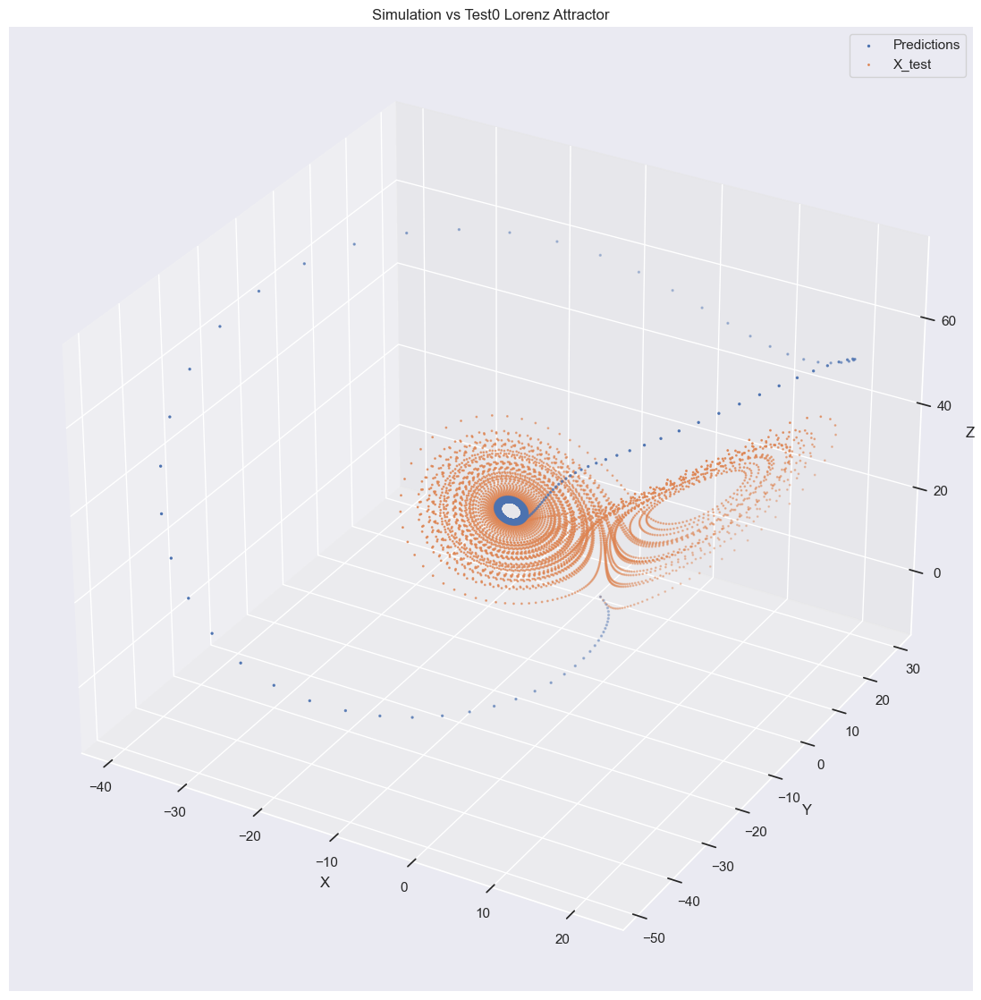

<Figure size 640x480 with 0 Axes>

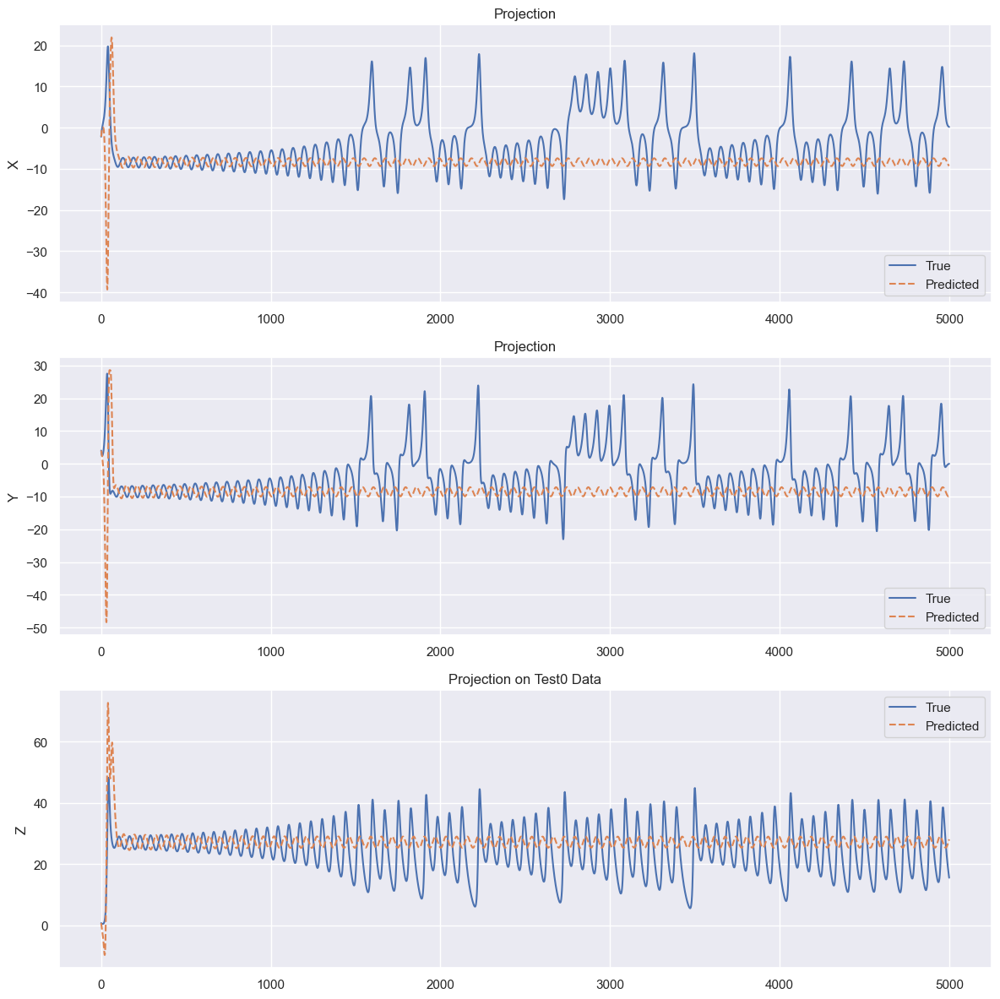

<Figure size 640x480 with 0 Axes>

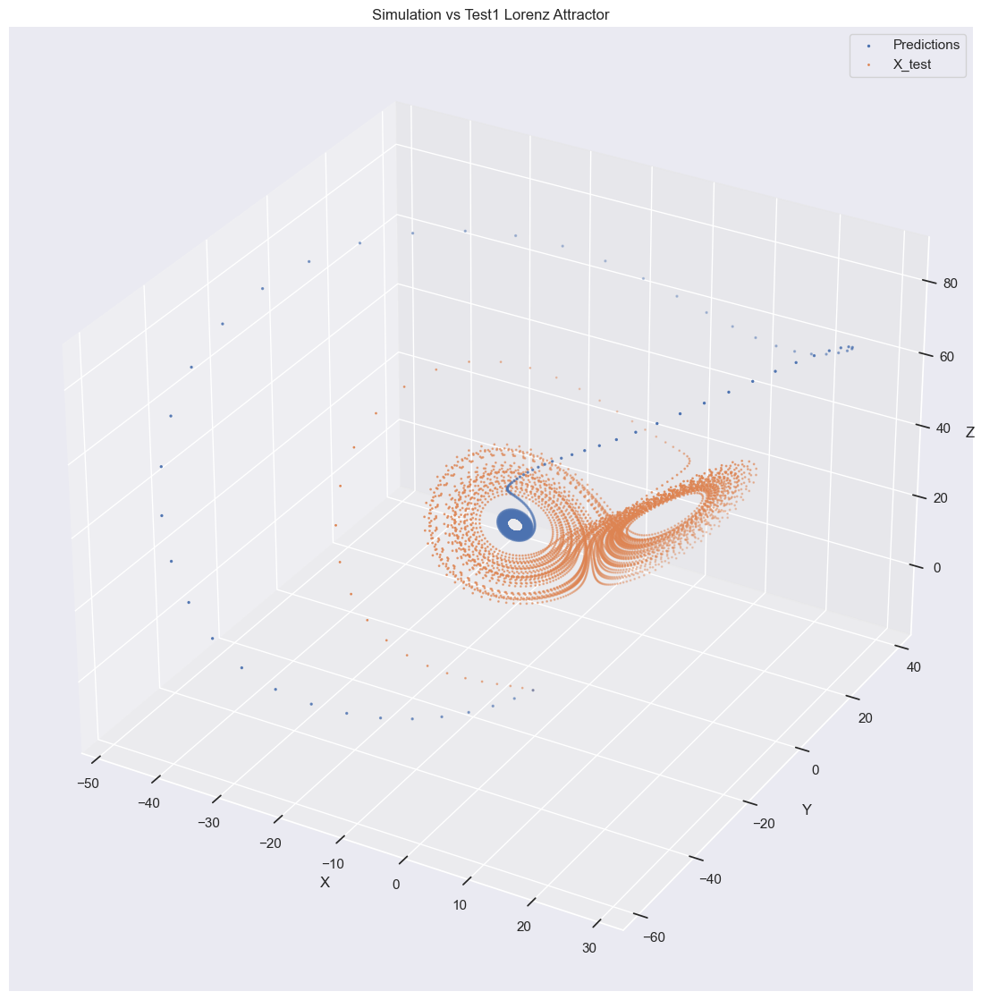

<Figure size 640x480 with 0 Axes>

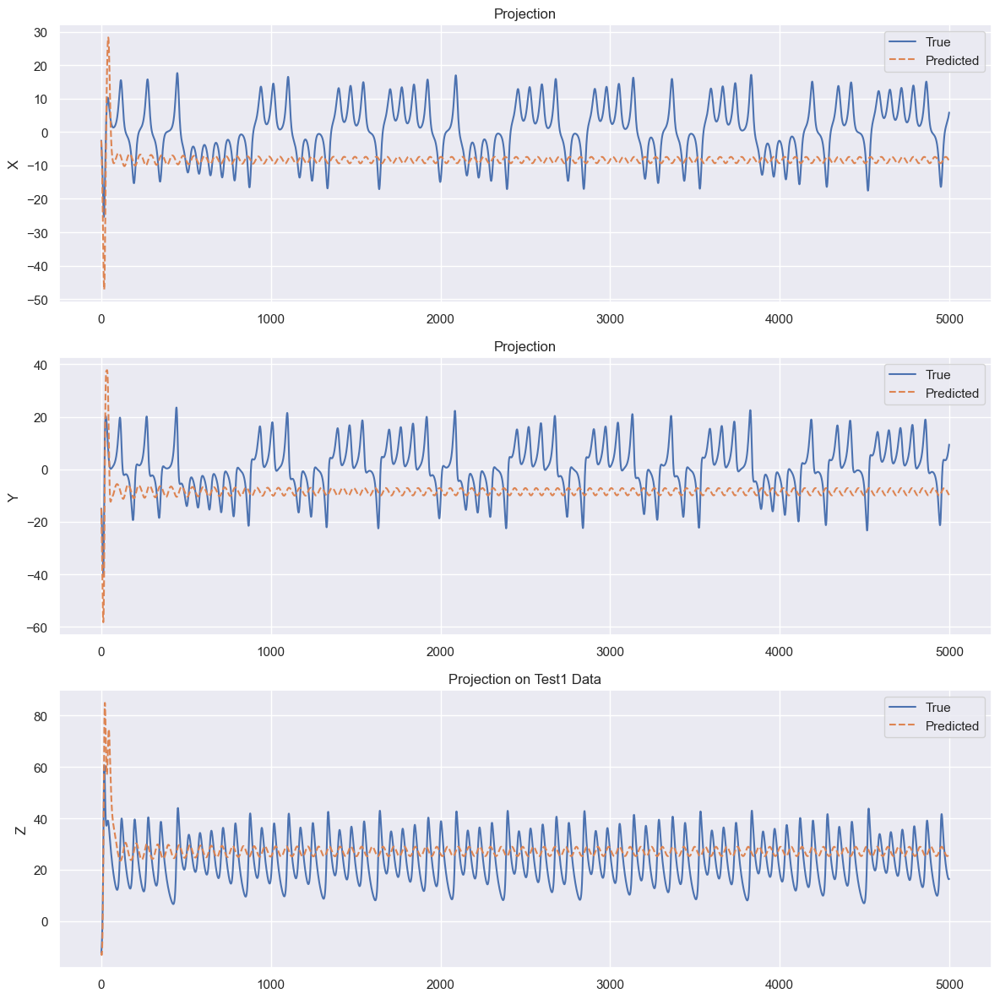

<Figure size 640x480 with 0 Axes>

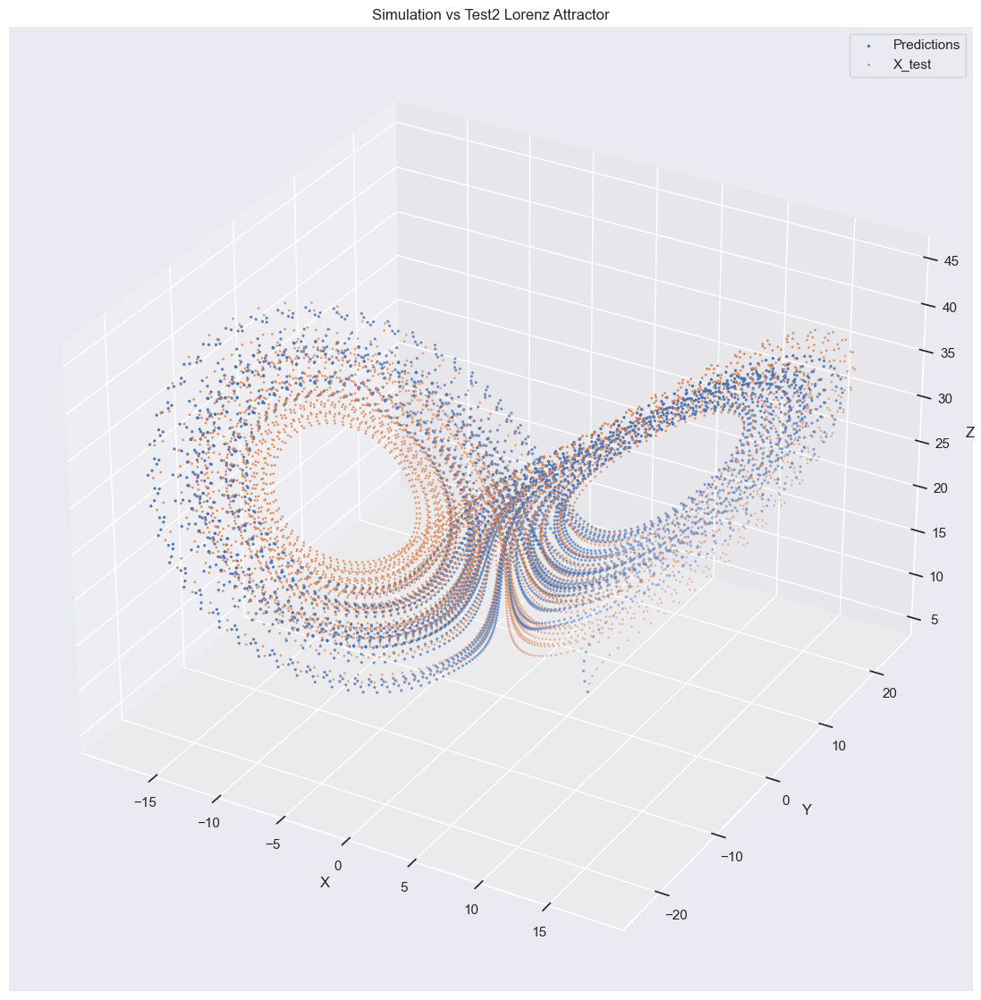

<Figure size 640x480 with 0 Axes>

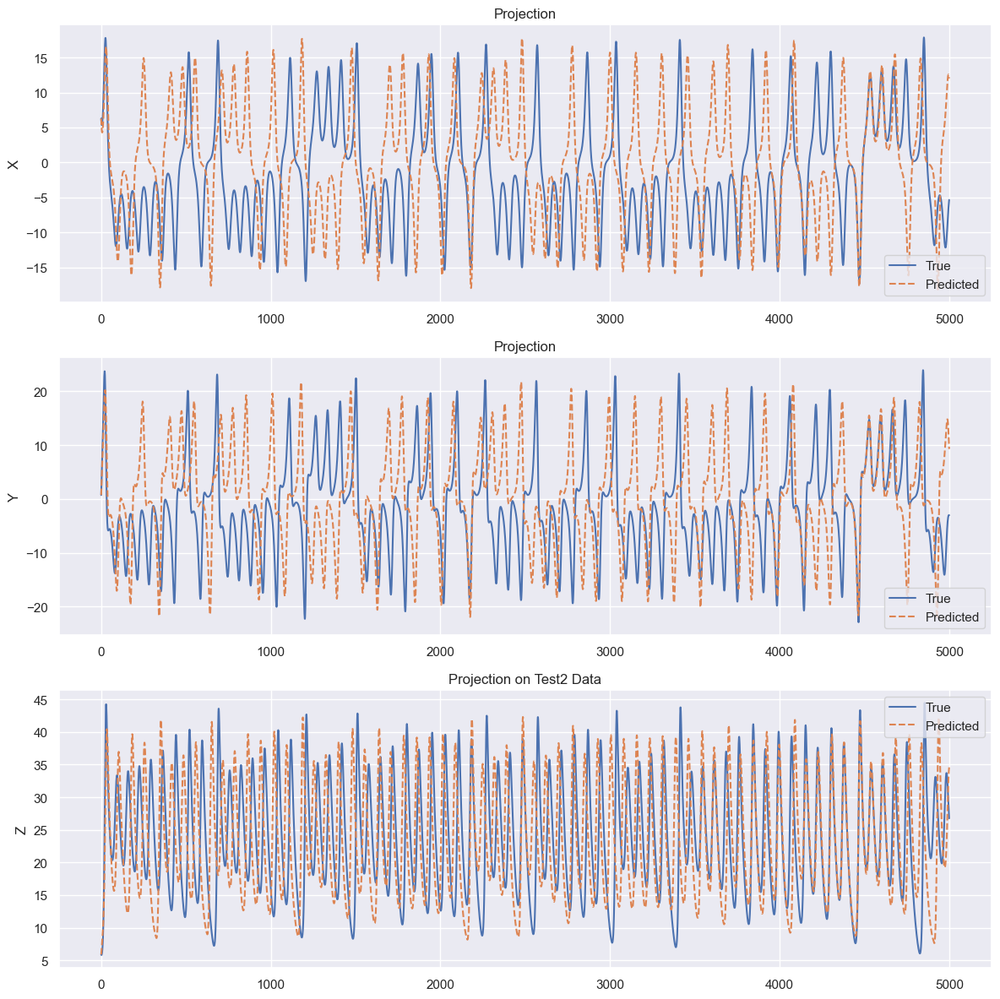

In [325]:
pred,losses = evaluate(test_model,t,test,label='Test')

In [326]:
losses

[86.62545013427734, 134.8922882080078, 140.37506103515625]

In [327]:
torch.save(losses,'test_losses_NODE.pt')

In [328]:
def plot_vector_field(predictions,label):
    for idx in range(len(predictions)):
        positions = predictions[idx][:, 0, :]  # Extracting the 3 components as positions

        # Create a new tensor with requires_grad=True
        positions = positions.clone().detach().requires_grad_(True)

        # Calculate the vector field by taking the derivatives of positions
        vector_field = torch.autograd.grad(positions, positions, torch.ones_like(positions), create_graph=True)[0]

        # Extract the x, y, and z components of the vector field
        U = vector_field[:, 0]
        V = vector_field[:, 1]
        W = vector_field[:, 2]

        # Move tensors to CPU before converting to NumPy arrays
        positions = positions.cpu().detach().numpy()
        U = U.cpu().detach().numpy()
        V = V.cpu().detach().numpy()
        W = W.cpu().detach().numpy()

        # Create a subset of positions for the arrows
        arrow_step = 1  # Adjust this to change the density of arrows
        arrow_positions = positions[::arrow_step]

        # Calculate arrow directions by normalizing the vector field components
        magnitude = np.sqrt(U**2 + V**2 + W**2)
        arrow_U = U / magnitude
        arrow_V = V / magnitude

        # Plot the vector field with arrows
        fig, ax = plt.subplots(figsize=(4, 4))
        ax.quiver(arrow_positions[:, 0], arrow_positions[:, 1], arrow_U[::arrow_step], arrow_V[::arrow_step], width=0.004, alpha=0.6)
        ax.set_xticks([])  # Remove x-axis ticks
        ax.set_yticks([])  # Remove y-axis ticks
        ax.set_xlabel('')   # Remove x-axis label
        ax.set_ylabel('')   # Remove y-axis label
        plt.title(f'Lorenz NODE Vector Field of {label}_{idx}  Predictions')
        plt.savefig(f'PNG/NODE/lorenz_NODE_Vector_Field_{label}_{idx}.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
        plt.tight_layout()
        plt.show()

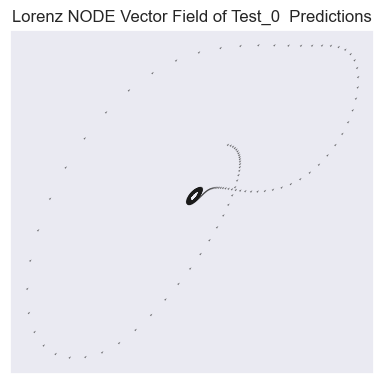

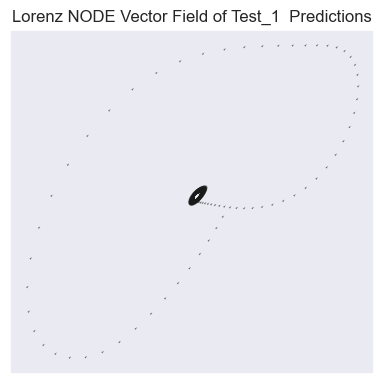

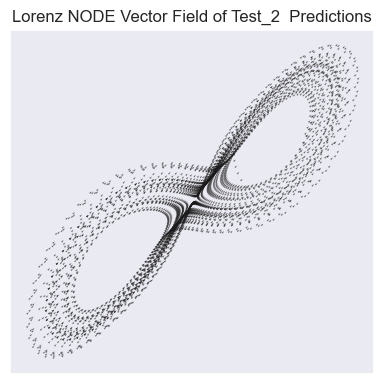

In [329]:
plot_vector_field(pred,label='Test')

<Figure size 640x480 with 0 Axes>

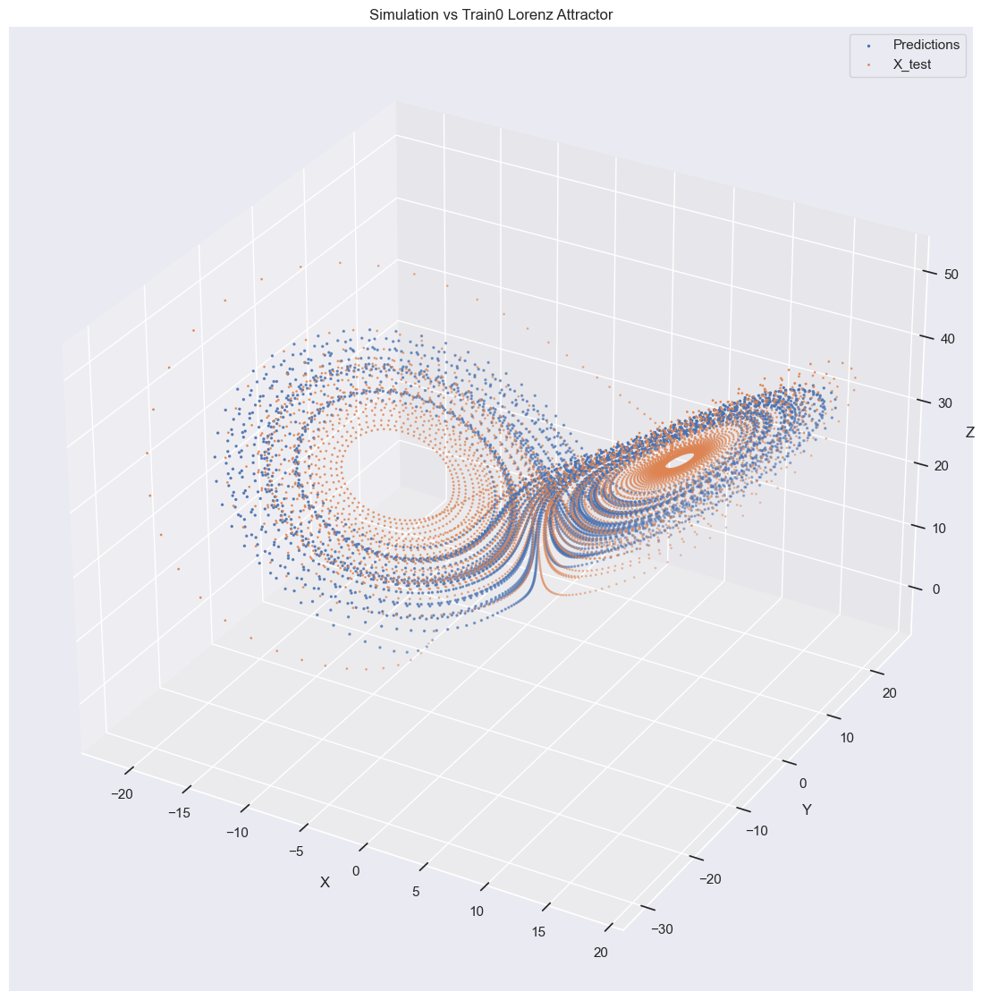

<Figure size 640x480 with 0 Axes>

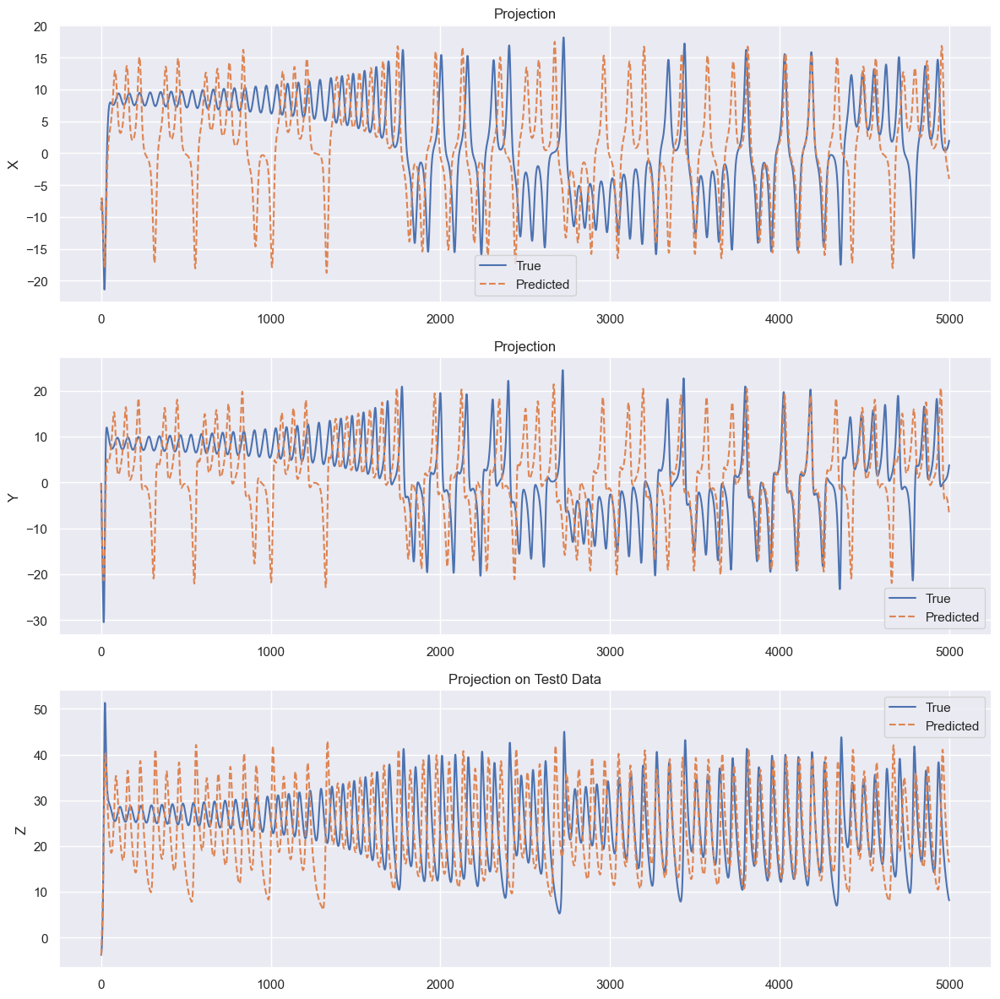

<Figure size 640x480 with 0 Axes>

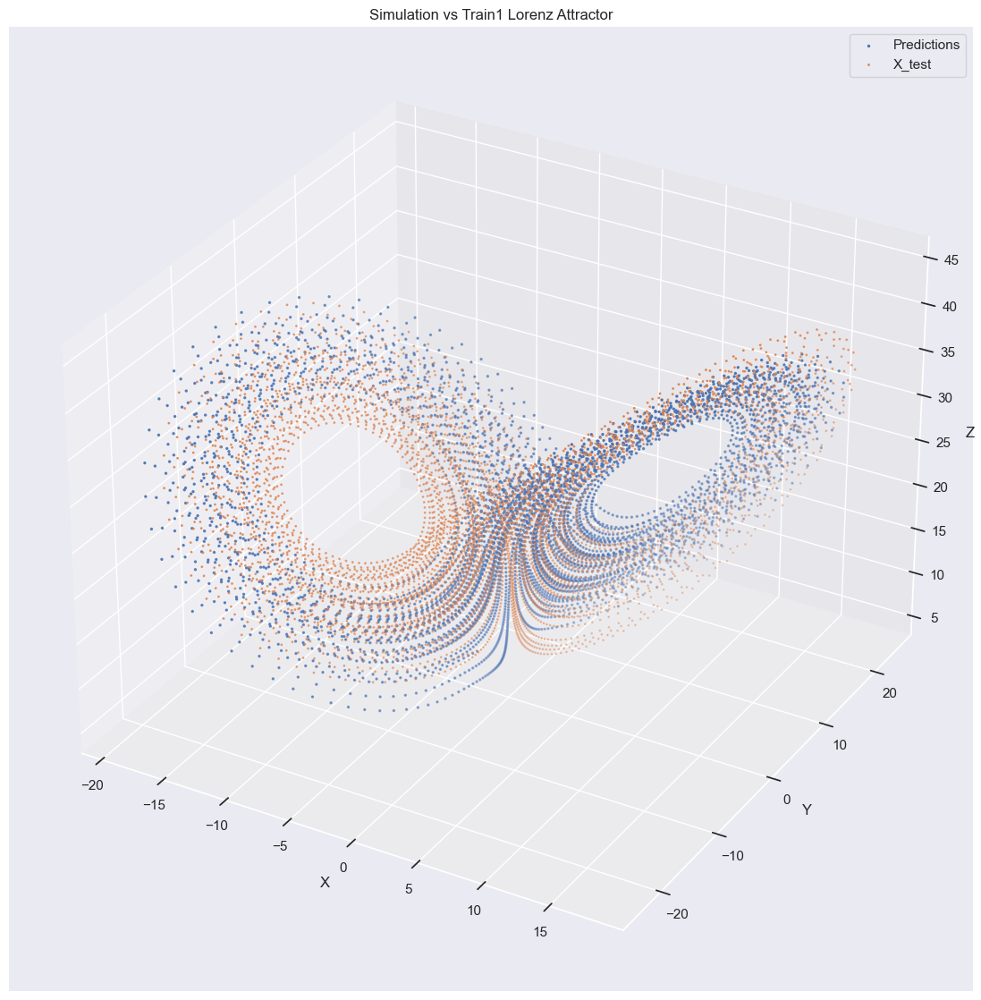

<Figure size 640x480 with 0 Axes>

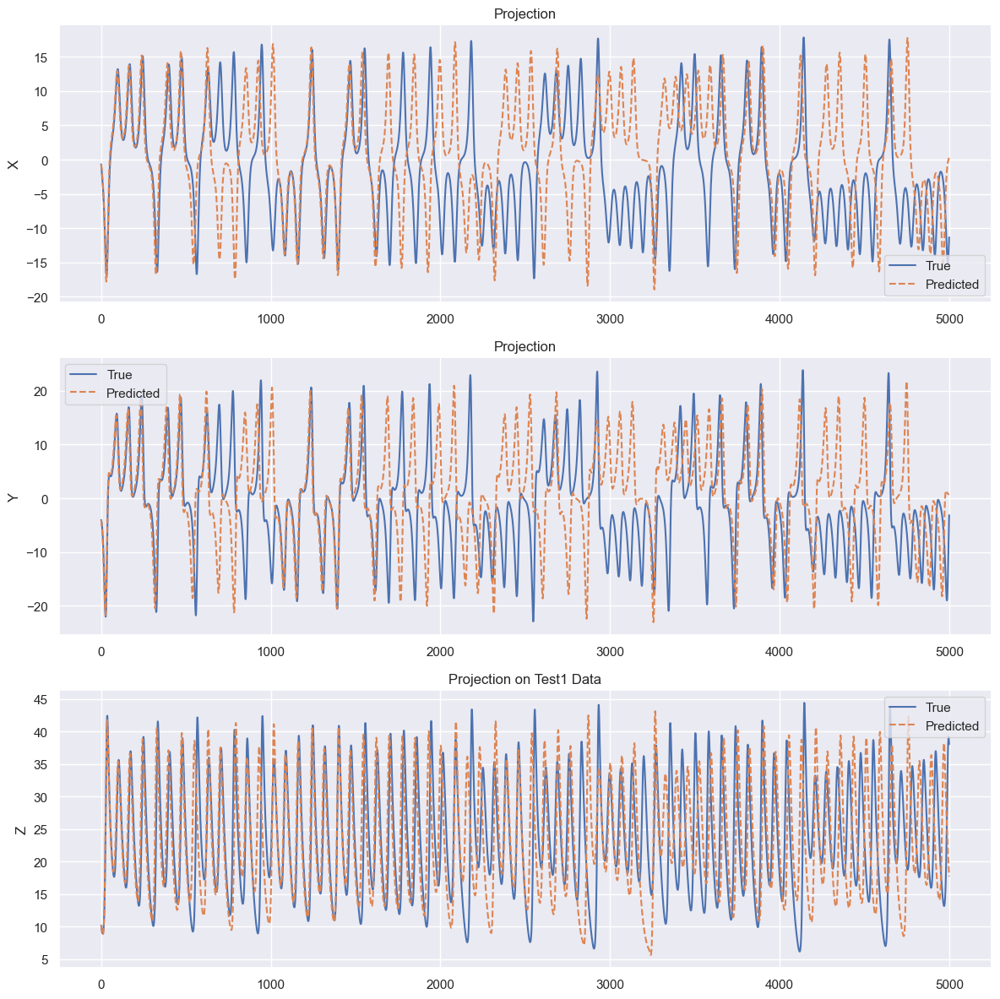

<Figure size 640x480 with 0 Axes>

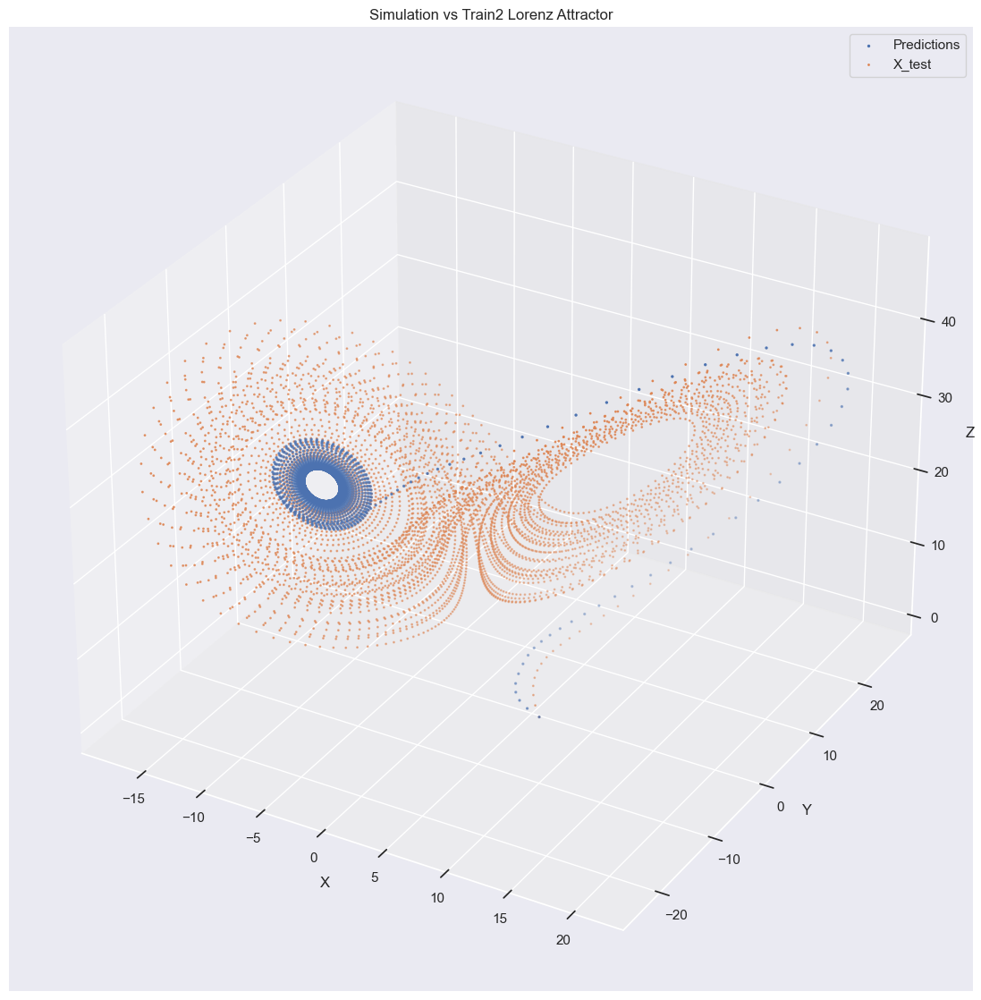

<Figure size 640x480 with 0 Axes>

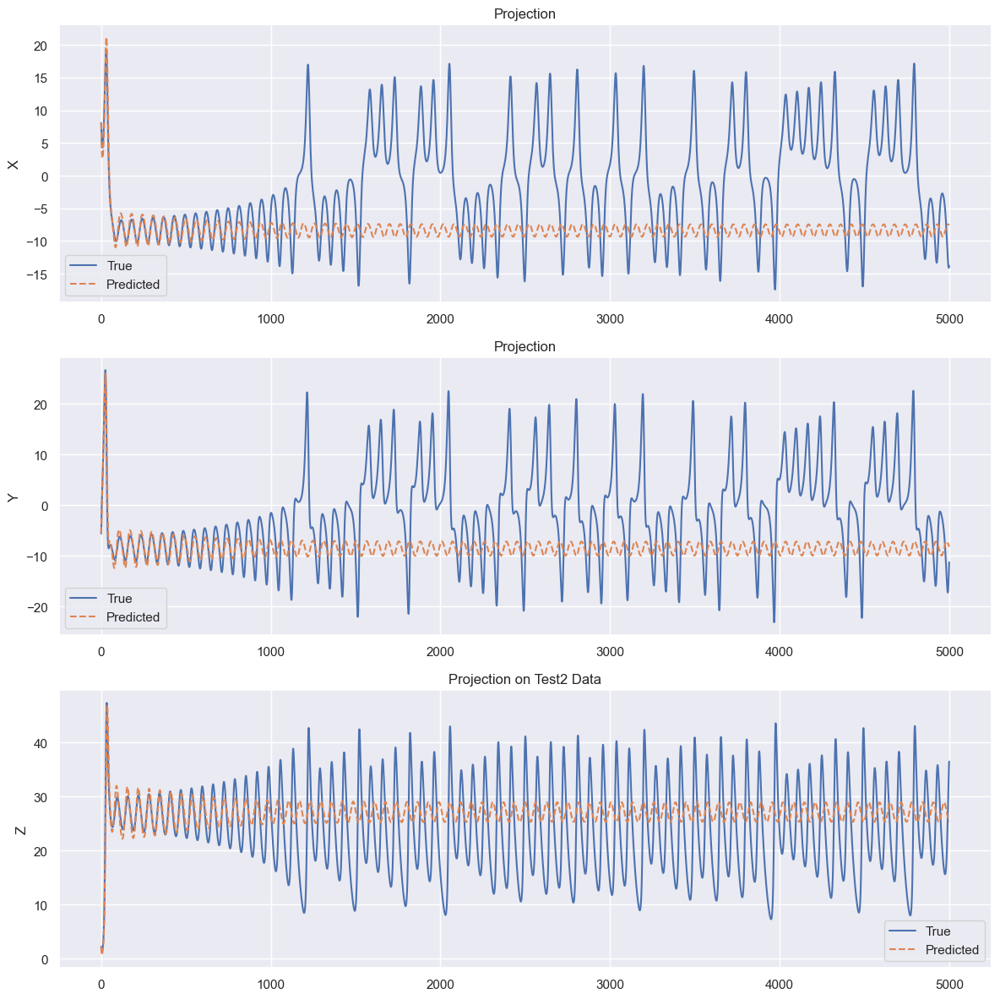

<Figure size 640x480 with 0 Axes>

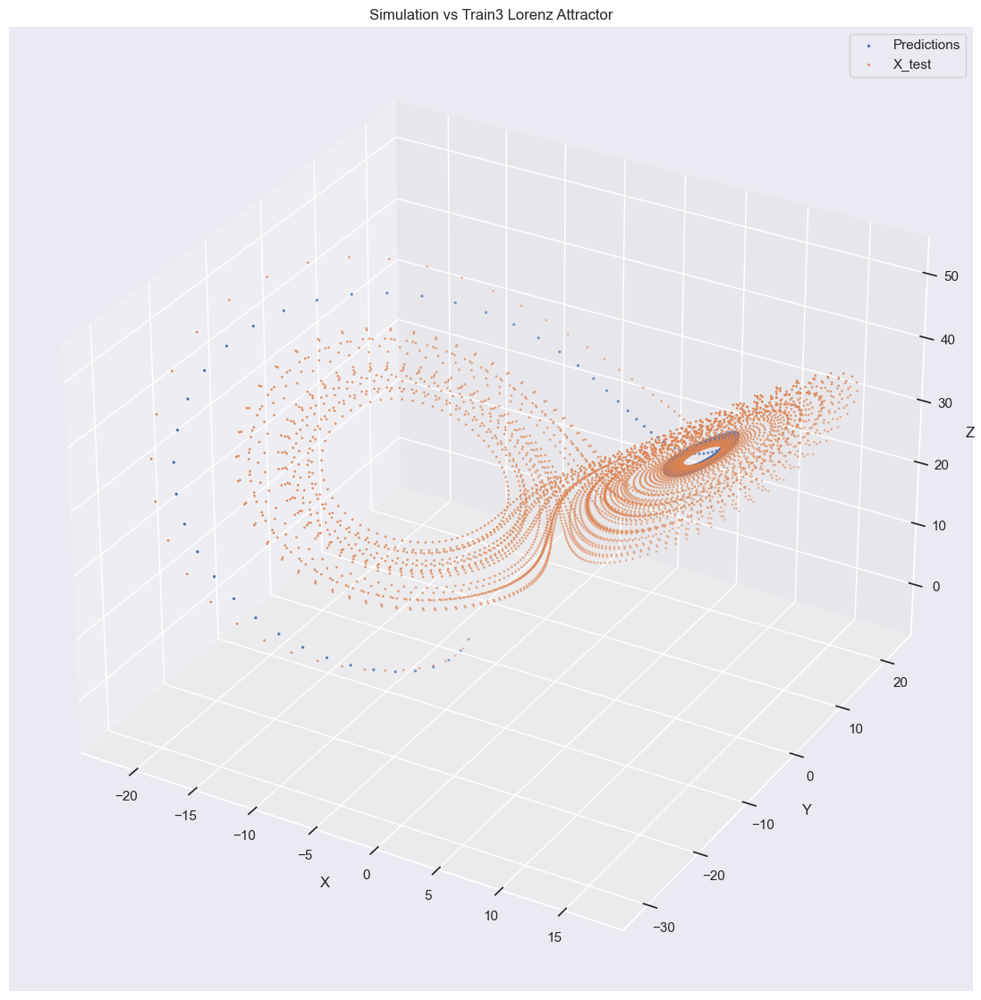

<Figure size 640x480 with 0 Axes>

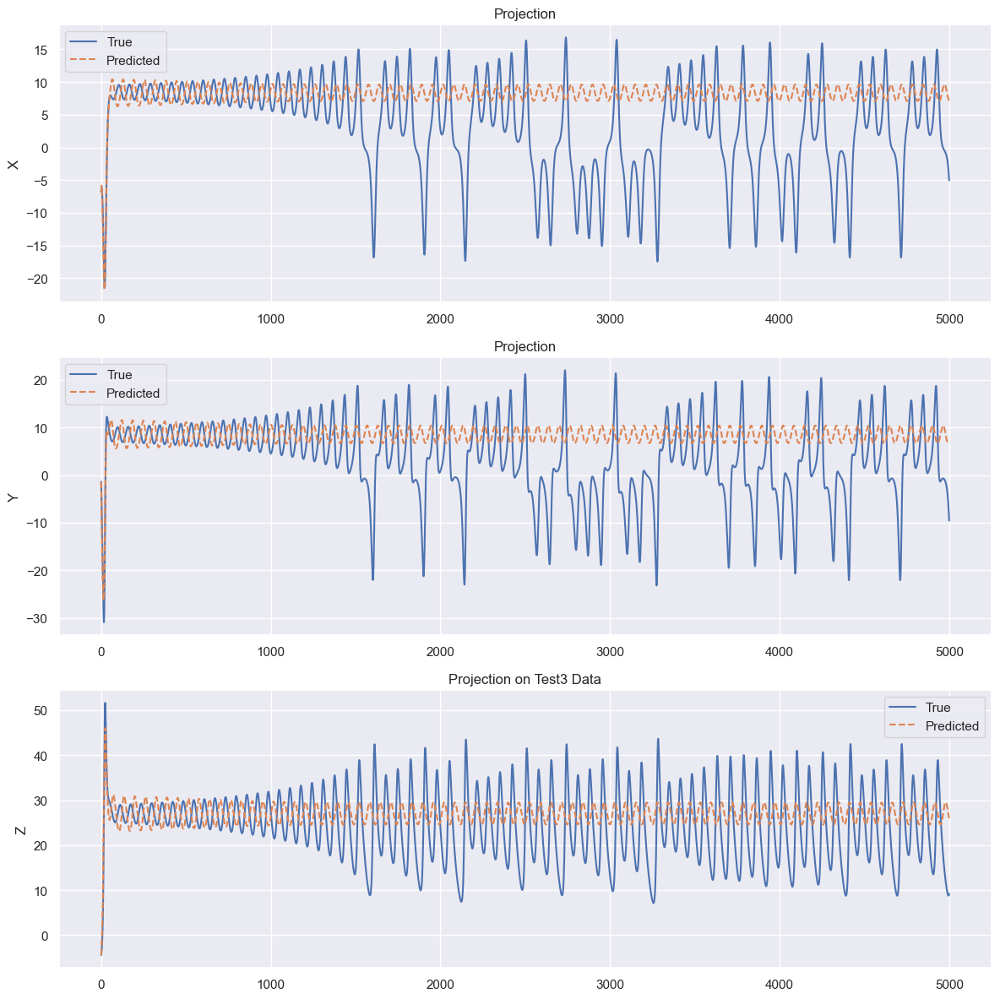

<Figure size 640x480 with 0 Axes>

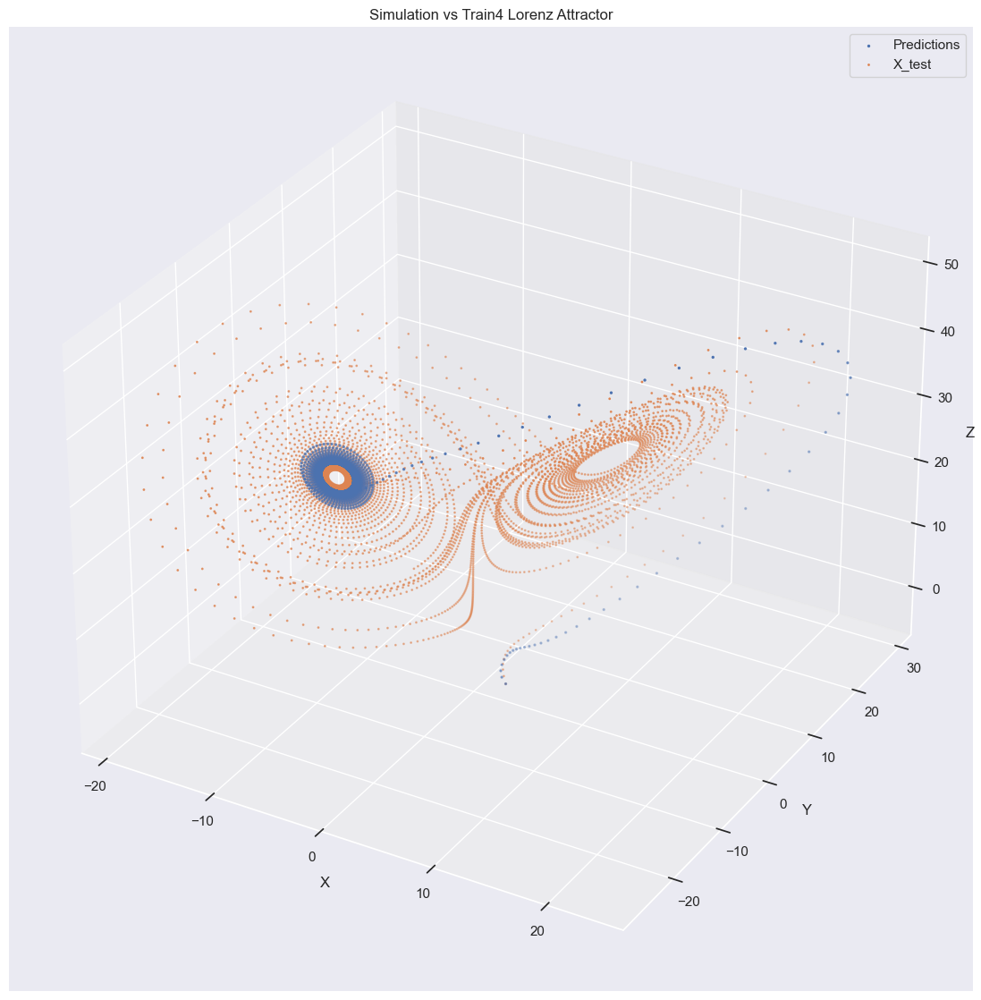

<Figure size 640x480 with 0 Axes>

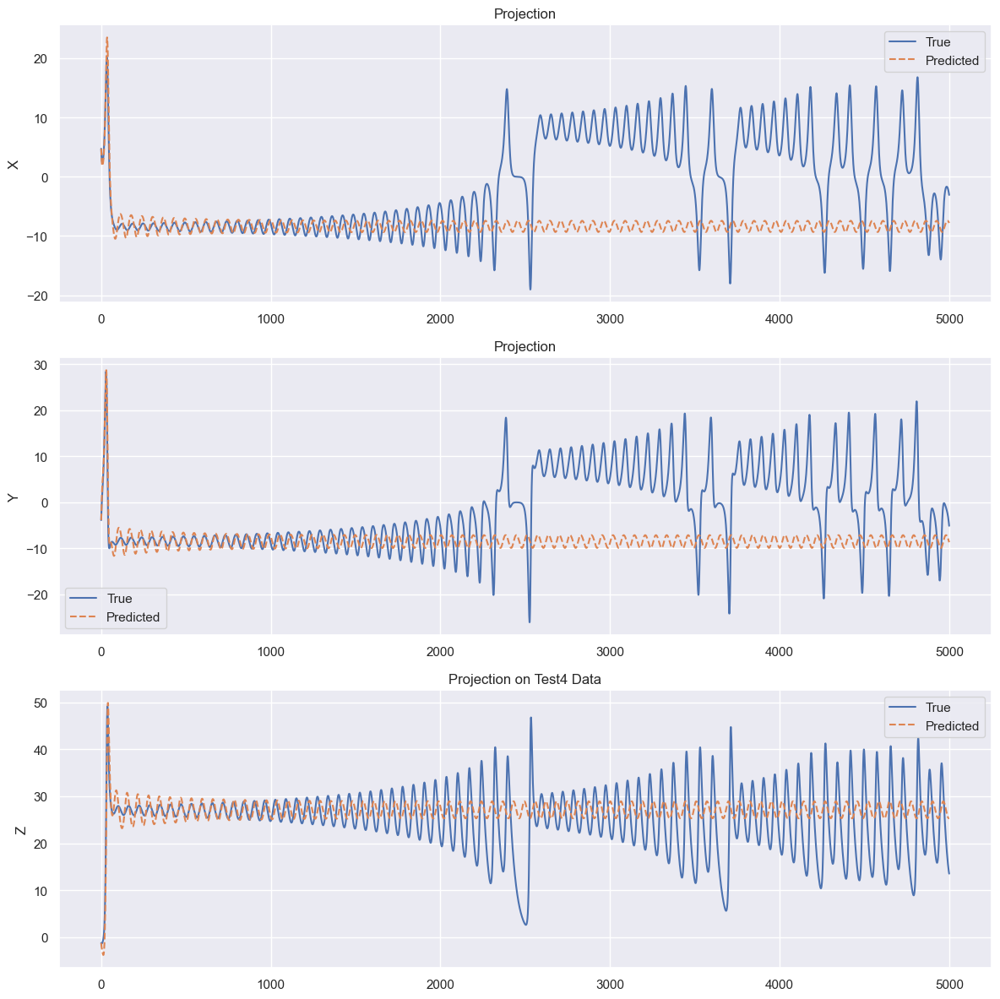

<Figure size 640x480 with 0 Axes>

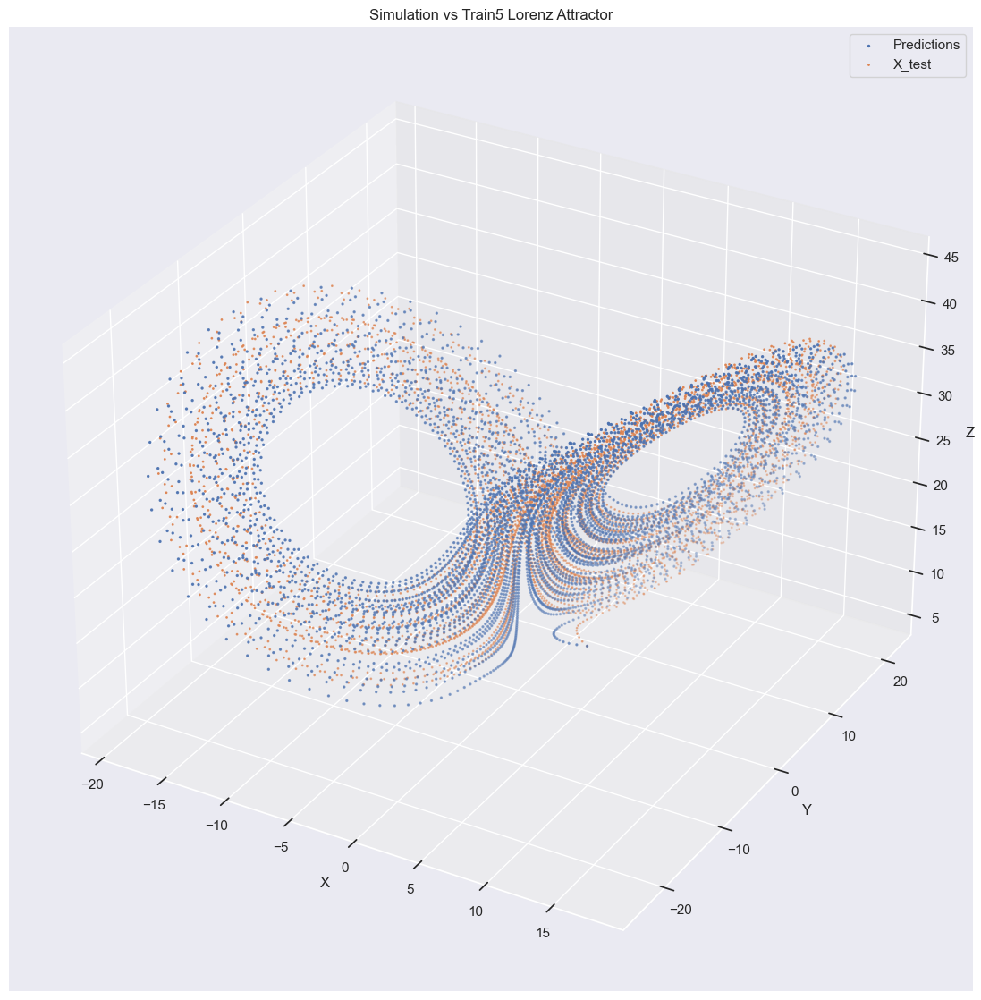

<Figure size 640x480 with 0 Axes>

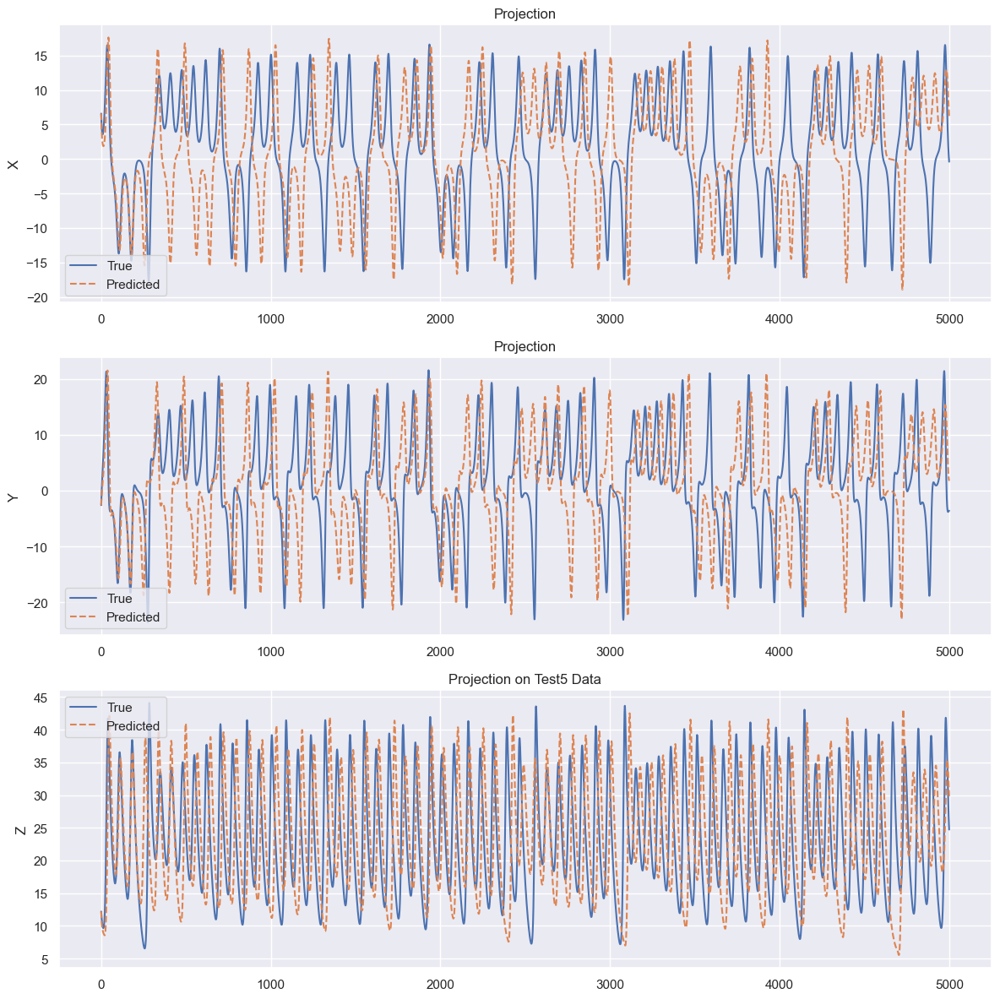

In [330]:
train_perf,train_l = evaluate(test_model,t,data_tensor[:6].to(device),label='Train')

In [331]:
train_l

[116.66519927978516,
 111.85391998291016,
 99.17925262451172,
 83.43665313720703,
 92.03057098388672,
 137.16192626953125]

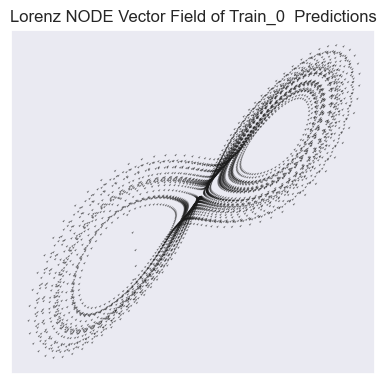

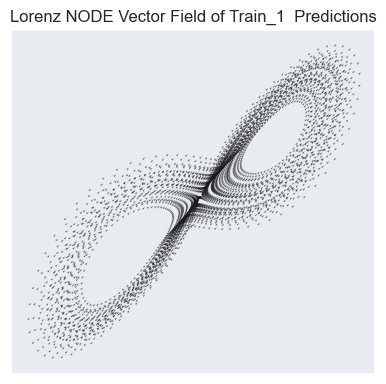

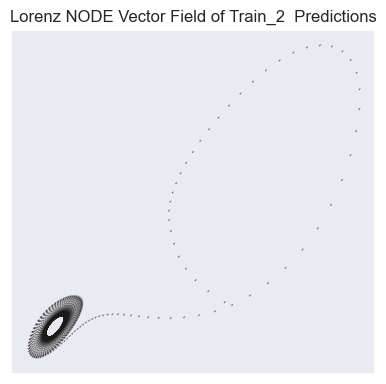

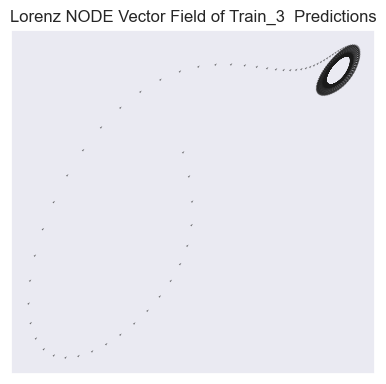

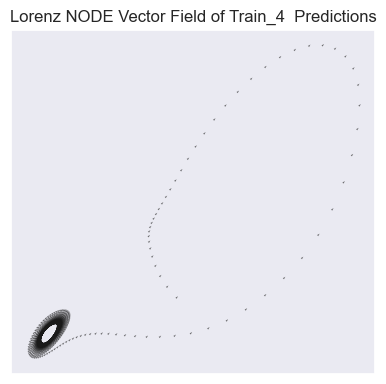

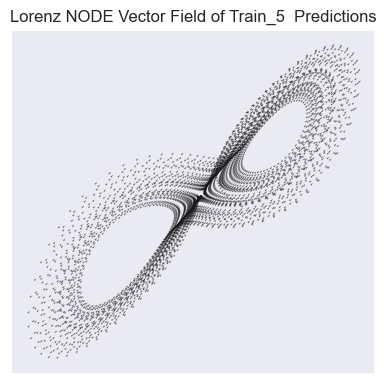

In [332]:
plot_vector_field(train_perf,label='Train')